# Meteorite Landings

### Installations

In [1]:
# !pip3 install --upgrade pip

In [2]:
# %pip install geopandas
# %pip install folium
# %pip install tabulate

### Imports

In [26]:
import sys

from tabulate import tabulate
import numpy as np
import pandas as pd

import geopandas

from shapely.geometry import box, Point

import folium

import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
%matplotlib inline

import contextily as cx

### Display Imports & Their Versions

In [27]:
headers = ["Software/Library", "Version"]

table_data = [
    ['Python', sys.version[0:6]],
    ['NumPy', np.__version__],
    ['Pandas', pd.__version__],
    ['geopandas', geopandas.__version__],
    ['Contextily', cx.__version__]
    ]

print(tabulate(table_data, headers=headers, tablefmt="grid"))

+--------------------+-----------+
| Software/Library   | Version   |
+====================+===========+
| Python             | 3.11.4    |
+--------------------+-----------+
| NumPy              | 1.26.4    |
+--------------------+-----------+
| Pandas             | 1.5.3     |
+--------------------+-----------+
| geopandas          | 1.0.1     |
+--------------------+-----------+
| Contextily         | 1.6.2     |
+--------------------+-----------+


### Import Dataset

In [28]:
df = geopandas.read_file("Meteorite_Landings.csv")

df

,name,id,nametype,recclass,mass (g),fall,year,reclat,reclong,GeoLocation
0,Aachen,1,Valid,L5,21,Fell,1880,50.775000,6.083330,"(50.775, 6.08333)"
1,Aarhus,2,Valid,H6,720,Fell,1951,56.183330,10.233330,"(56.18333, 10.23333)"
2,Abee,6,Valid,EH4,107000,Fell,1952,54.216670,-113.000000,"(54.21667, -113.0)"
3,Acapulco,10,Valid,Acapulcoite,1914,Fell,1976,16.883330,-99.900000,"(16.88333, -99.9)"
4,Achiras,370,Valid,L6,780,Fell,1902,-33.166670,-64.950000,"(-33.16667, -64.95)"
...,...,...,...,...,...,...,...,...,...,...
45711,Zillah 002,31356,Valid,Eucrite,172,Found,1990,29.037000,17.018500,"(29.037, 17.0185)"
45712,Zinder,30409,Valid,"Pallasite, ungrouped",46,Found,1999,13.783330,8.966670,"(13.78333, 8.96667)"
45713,Zlin,30410,Valid,H4,3.3,Found,1939,49.250000,17.666670,"(49.25, 17.66667)"
45714,Zubkovsky,31357,Valid,L6,2167,Found,2003,49.789170,41.504600,"(49.78917, 41.5046)"


### Return Information About Unqiue Values in Select Features

In [29]:
cols_to_check = [
    'name',
    'id',
    'nametype',
    'recclass',
    'mass (g)',
    'fall',
    'year',
    'reclat',
    'reclong'
]

cutoff = int(len(df) / 10)

for col in cols_to_check:
    u_vals = np.sort(df[col].unique())
    if len(u_vals) < cutoff:
        print(f"{col} ({len(u_vals)})\n{u_vals}\n")
    else:
        print(f"{col} ({len(u_vals)})\n")

name (45716)

id (45716)

nametype (2)
['Relict' 'Valid']

recclass (466)
['Acapulcoite' 'Acapulcoite/Lodranite' 'Acapulcoite/lodranite'
 'Achondrite-prim' 'Achondrite-ung' 'Angrite' 'Aubrite' 'Aubrite-an'
 'Brachinite' 'C' 'C1-ung' 'C1/2-ung' 'C2' 'C2-ung' 'C3-ung' 'C3.0-ung'
 'C3/4-ung' 'C4' 'C4-ung' 'C4/5' 'C5/6-ung' 'C6' 'CB' 'CBa' 'CBb' 'CH/CBb'
 'CH3' 'CH3 ' 'CI1' 'CK' 'CK3' 'CK3-an' 'CK3.8' 'CK3/4' 'CK4' 'CK4-an'
 'CK4/5' 'CK5' 'CK5/6' 'CK6' 'CM' 'CM-an' 'CM1' 'CM1/2' 'CM2' 'CM2-an'
 'CO3' 'CO3 ' 'CO3.0' 'CO3.1' 'CO3.2' 'CO3.3' 'CO3.4' 'CO3.5' 'CO3.6'
 'CO3.7' 'CO3.8' 'CR' 'CR-an' 'CR1' 'CR2' 'CR2-an' 'CR7' 'CV2' 'CV3'
 'CV3-an' 'Chondrite-fusion crust' 'Chondrite-ung' 'Diogenite'
 'Diogenite-an' 'Diogenite-olivine' 'Diogenite-pm' 'E' 'E-an' 'E3' 'E3-an'
 'E4' 'E5' 'E5-an' 'E6' 'EH' 'EH-imp melt' 'EH3' 'EH3/4-an' 'EH4' 'EH4/5'
 'EH5' 'EH6' 'EH6-an' 'EH7' 'EH7-an' 'EL-melt rock' 'EL3' 'EL3/4' 'EL4'
 'EL4/5' 'EL5' 'EL6' 'EL6 ' 'EL6/7' 'EL7' 'Enst achon' 'Enst achon-ung'
 'Eucrite'

In [30]:
df.describe(include='all')

,name,id,nametype,recclass,mass (g),fall,year,reclat,reclong,GeoLocation
count,45716,45716,45716,45716,45716,45716,45716,45716,45716,45716
unique,45716,45716,2,466,12577,2,266,12739,14641,17101
top,Aachen,1,Valid,L6,1.3,Found,2003,,,
freq,1,1,45641,8285,171,44609,3323,7315,7315,7315


### Remove Samples with Missing Values in Specific Features

In [31]:
df = df[df['nametype'] == 'Valid']

cols_to_clean = ['year', 'reclat', 'reclong']

for col in cols_to_clean:
    df[col] = df[col].replace('', np.nan)

df = df.dropna(subset=['GeoLocation', 'reclat', 'reclong'])

df.describe(include='all')

/var/folders/93/v_c2ph_17t97zdkzc4_ccjtw0000gn/T/ipykernel_79506/1041816058.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[col] = df[col].replace('', np.nan)


,name,id,nametype,recclass,mass (g),fall,year,reclat,reclong,GeoLocation
count,38331,38331,38331,38331,38331,38331,38154,38331,38331,38331
unique,38331,38331,1,422,11272,2,265,12733,14635,17095
top,Aachen,1,Valid,L6,1.3,Found,1979,0.000000,0.000000,"(0.0, 0.0)"
freq,1,1,38331,7543,155,37234,3045,6438,6214,6214


### Impute Missing Values in Specific Features

In [32]:
df['mass (g)'] = df['mass (g)'].replace('', '-1')
df['year'] = df['year'].replace('', '-1')

df

,name,id,nametype,recclass,mass (g),fall,year,reclat,reclong,GeoLocation
0,Aachen,1,Valid,L5,21,Fell,1880,50.775000,6.083330,"(50.775, 6.08333)"
1,Aarhus,2,Valid,H6,720,Fell,1951,56.183330,10.233330,"(56.18333, 10.23333)"
2,Abee,6,Valid,EH4,107000,Fell,1952,54.216670,-113.000000,"(54.21667, -113.0)"
3,Acapulco,10,Valid,Acapulcoite,1914,Fell,1976,16.883330,-99.900000,"(16.88333, -99.9)"
4,Achiras,370,Valid,L6,780,Fell,1902,-33.166670,-64.950000,"(-33.16667, -64.95)"
...,...,...,...,...,...,...,...,...,...,...
45711,Zillah 002,31356,Valid,Eucrite,172,Found,1990,29.037000,17.018500,"(29.037, 17.0185)"
45712,Zinder,30409,Valid,"Pallasite, ungrouped",46,Found,1999,13.783330,8.966670,"(13.78333, 8.96667)"
45713,Zlin,30410,Valid,H4,3.3,Found,1939,49.250000,17.666670,"(49.25, 17.66667)"
45714,Zubkovsky,31357,Valid,L6,2167,Found,2003,49.789170,41.504600,"(49.78917, 41.5046)"


### Remove Select Features 

In [33]:
cols_to_remove = [
    "id",
    "nametype",
    "GeoLocation"
]

df.drop(columns=cols_to_remove, inplace=True)

df

,name,recclass,mass (g),fall,year,reclat,reclong
0,Aachen,L5,21,Fell,1880,50.775000,6.083330
1,Aarhus,H6,720,Fell,1951,56.183330,10.233330
2,Abee,EH4,107000,Fell,1952,54.216670,-113.000000
3,Acapulco,Acapulcoite,1914,Fell,1976,16.883330,-99.900000
4,Achiras,L6,780,Fell,1902,-33.166670,-64.950000
...,...,...,...,...,...,...,...
45711,Zillah 002,Eucrite,172,Found,1990,29.037000,17.018500
45712,Zinder,"Pallasite, ungrouped",46,Found,1999,13.783330,8.966670
45713,Zlin,H4,3.3,Found,1939,49.250000,17.666670
45714,Zubkovsky,L6,2167,Found,2003,49.789170,41.504600


### Rename Features as Needed

In [34]:
cols_to_rename = {
    "name": 'event_name',
    "recclass": 'event_classification',
    "mass (g)": 'mass_in_grams',
    "fall": 'how_it_was_found',
    "year": 'event_year',
    "reclat": 'latitude',
    "reclong": 'longitude'
}

df.rename(columns=cols_to_rename, inplace=True)

df.head()

,event_name,event_classification,mass_in_grams,how_it_was_found,event_year,latitude,longitude
0,Aachen,L5,21,Fell,1880,50.775000,6.083330
1,Aarhus,H6,720,Fell,1951,56.183330,10.233330
2,Abee,EH4,107000,Fell,1952,54.216670,-113.000000
3,Acapulco,Acapulcoite,1914,Fell,1976,16.883330,-99.900000
4,Achiras,L6,780,Fell,1902,-33.166670,-64.950000


### Convert Pandas DataFrame to GeoPandas GeoDataFrame

In [35]:
gdf = geopandas.GeoDataFrame(
    df, 
    geometry=geopandas.points_from_xy(df.longitude, df.latitude), crs="EPSG:4326"
)

gdf.drop(columns=["latitude", "longitude"], inplace=True)

gdf.head()

,event_name,event_classification,mass_in_grams,how_it_was_found,event_year,geometry
0,Aachen,L5,21,Fell,1880,POINT (6.08333 50.775)
1,Aarhus,H6,720,Fell,1951,POINT (10.23333 56.18333)
2,Abee,EH4,107000,Fell,1952,POINT (-113 54.21667)
3,Acapulco,Acapulcoite,1914,Fell,1976,POINT (-99.9 16.88333)
4,Achiras,L6,780,Fell,1902,POINT (-64.95 -33.16667)


## Data Visualizations

### Non-Interactive Data Visualization

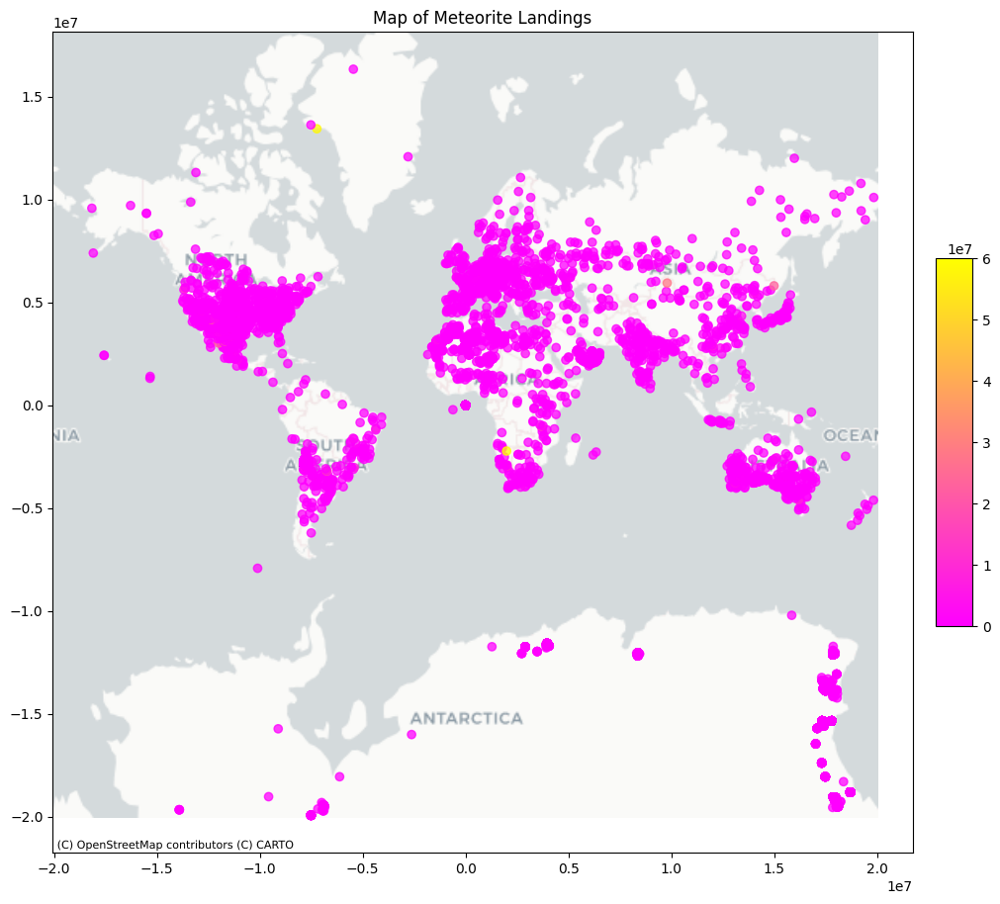

In [36]:
gdf_plot = gdf.to_crs(epsg=3857)

gdf_plot['mass_in_grams'] = gdf_plot['mass_in_grams'].astype(float)

norm = mcolors.Normalize(vmin=np.min(gdf_plot['mass_in_grams']), vmax=np.max(gdf_plot['mass_in_grams']))

valid_bounds = box(-20037508.34, -20037508.34, 20037508.34, 20037508.34)

gdf_clipped = geopandas.clip(gdf_plot, valid_bounds)

fig, ax = plt.subplots(figsize=(12, 12))
gdf_clipped.plot(
    column='mass_in_grams', 
    cmap='spring',
    ax=ax, 
    alpha=0.75, 
    norm=norm,
    legend=True,
    legend_kwds={
        "shrink": 0.5,
        "aspect": 10,
        "pad": 0.025,
        "fraction": 0.04,
        "orientation": "vertical"
    }
    )

cx.add_basemap(ax, source=cx.providers.CartoDB.Positron)

ax.set_title("Map of Meteorite Landings")

plt.show()

### Interactive Data Visualization

In [ ]:
gdf.explore(
    m = folium.Map(
        location=[0, 0], 
        tiles="OpenStreetMap",
        zoom_start=1,
        prefer_canvas=True
        ),
    popup=True,
    highlight=True,
    legend=True,
    control_scale=True,
    style_kwds = {
        'stroke': True,
        'color': '#3271a5',
        'weight': 0.50,
        'opacity': 0.65,
        'fill': True,
        'fillColor': '#b8e2f4',
        'fillOpacity': 0.20
    },
    highlight_kwds ={
        'stroke': True,
        'color': 'green',
        'weight': 5,
        'opacity': 1,
        'fill': True,
        'fillColor': '#88e788',
        'fillOpacity': 0.75
    },
    tooltip_kwds = {
        'labels': True,
        'aliases': [
            'Event Name',
            'Event Classification',
            'Meteorite Mass (in Grams)',
            'How It was Discovered',
            'Year of the Event'
            ]
    }
)


## Methods & Attributes

### Dissolve By 'how_it_was_found' Feature

In [41]:
gdf.dissolve(by='how_it_was_found', sort=True)

,geometry,event_name,event_classification,mass_in_grams,event_year
how_it_was_found,,,,,
Fell,"MULTIPOINT (-157.86667 21.3, -157.78333 21.3, ...",Aachen,L5,21,1880
Found,"MULTIPOINT (-165.43333 -86.45, -165.11667 -86....",Northwest Africa 5815,L5,256.8,1982


### Append Column With Geometry Type for Each Record

In [42]:
print("Geometry Type")

gdf_gt = gdf.copy()
gdf_gt['geometry_type'] = gdf.geom_type

gdf_gt

Geometry Type


,event_name,event_classification,mass_in_grams,how_it_was_found,event_year,geometry,geometry_type
0,Aachen,L5,21,Fell,1880,POINT (6.08333 50.775),Point
1,Aarhus,H6,720,Fell,1951,POINT (10.23333 56.18333),Point
2,Abee,EH4,107000,Fell,1952,POINT (-113 54.21667),Point
3,Acapulco,Acapulcoite,1914,Fell,1976,POINT (-99.9 16.88333),Point
4,Achiras,L6,780,Fell,1902,POINT (-64.95 -33.16667),Point
...,...,...,...,...,...,...,...
45711,Zillah 002,Eucrite,172,Found,1990,POINT (17.0185 29.037),Point
45712,Zinder,"Pallasite, ungrouped",46,Found,1999,POINT (8.96667 13.78333),Point
45713,Zlin,H4,3.3,Found,1939,POINT (17.66667 49.25),Point
45714,Zubkovsky,L6,2167,Found,2003,POINT (41.5046 49.78917),Point


### Determine Point's Distance From Harvard

In [43]:
# Use the Harvard address coordinates as the reference point for distances

latitude = 42.3745
longitude = -71.1185

# Create a Shapely Point object
ref_point = Point(longitude, latitude)

if gdf.crs is None:
    gdf.set_crs(epsg=4326, inplace=True)

# Estimate an appropriate UTM CRS for your GeoDataFrame
utm_crs = gdf.estimate_utm_crs()

# Reproject your GeoDataFrame to the estimated UTM CRS
gdf_projected = gdf.to_crs(utm_crs)

# Reproject the reference point to the same UTM CRS
ref_point_projected = geopandas.GeoSeries([ref_point], crs='EPSG:4326').to_crs(utm_crs).iloc[0]

In [44]:
gdf_projected['dist_from_harvard'] = gdf_projected['geometry'].distance(ref_point)
gdf_projected['hausdorff_dist_from_harvard'] = gdf_projected['geometry'].hausdorff_distance(ref_point)
gdf_projected['frechet_dist_from_harvard'] = gdf_projected['geometry'].frechet_distance(ref_point)

gdf_projected

,event_name,event_classification,mass_in_grams,how_it_was_found,event_year,geometry,dist_from_harvard,hausdorff_dist_from_harvard,frechet_dist_from_harvard
0,Aachen,L5,21,Fell,1880,POINT (-4250153.764 19717891.672),2.017069e+07,2.017069e+07,2.017069e+07
1,Aarhus,H6,720,Fell,1951,POINT (-3470285.49 19460498.259),1.976744e+07,1.976744e+07,1.976744e+07
2,Abee,EH4,107000,Fell,1952,POINT (2175218.765 23670786.811),2.377049e+07,2.377049e+07,2.377049e+07
3,Acapulco,Acapulcoite,1914,Fell,1976,POINT (1883764.429 28083482.815),2.814655e+07,2.814655e+07,2.814655e+07
4,Achiras,L6,780,Fell,1902,POINT (-1575950.496 -6100857.412),6.301141e+06,6.301141e+06,6.301141e+06
...,...,...,...,...,...,...,...,...,...
45711,Zillah 002,Eucrite,172,Found,1990,POINT (-7464149.565 17387460.414),1.892181e+07,1.892181e+07,1.892181e+07
45712,Zinder,"Pallasite, ungrouped",46,Found,1999,POINT (-12334430.136 17536104.476),2.143945e+07,2.143945e+07,2.143945e+07
45713,Zlin,H4,3.3,Found,1939,POINT (-4250353.211 18627051.654),1.910577e+07,1.910577e+07,1.910577e+07
45714,Zubkovsky,L6,2167,Found,2003,POINT (-3053558.592 16904091.259),1.717762e+07,1.717762e+07,1.717762e+07


### Retrieve Coordinates

In [45]:
gdf_get_coords = gdf.get_coordinates(include_z=True)
gdf_count_coords = gdf.count_coordinates()
gdf_count_geos = gdf.count_geometries()

print(f"GDF Coordinates:\n{gdf_get_coords}\n")
print(f"GDF Count Coordinates:\n{gdf_count_coords}\n")
print(f"GDF Count Geometries:\n{gdf_count_geos}")

GDF Coordinates:
               x         y   z
0        6.08333  50.77500 NaN
1       10.23333  56.18333 NaN
2     -113.00000  54.21667 NaN
3      -99.90000  16.88333 NaN
4      -64.95000 -33.16667 NaN
...          ...       ...  ..
45711   17.01850  29.03700 NaN
45712    8.96667  13.78333 NaN
45713   17.66667  49.25000 NaN
45714   41.50460  49.78917 NaN
45715 -115.68333  33.98333 NaN

[38331 rows x 3 columns]

GDF Count Coordinates:
0        1
1        1
2        1
3        1
4        1
        ..
45711    1
45712    1
45713    1
45714    1
45715    1
Length: 38331, dtype: int32

GDF Count Geometries:
0        1
1        1
2        1
3        1
4        1
        ..
45711    1
45712    1
45713    1
45714    1
45715    1
Length: 38331, dtype: int32


In [46]:
gdf.count_coordinates().mean()

1.0

In [47]:
gdf.count_geometries().mean()

1.0

### Some Basic Functions

In [50]:
gdf_is_simple = gdf.is_simple
gdf_is_valid = gdf.is_valid
gdf_is_valid_reason = gdf.is_valid_reason()
gdf_has_z = gdf.has_z

gdf_is_simple_value_counts = gdf_is_simple.value_counts()
gdf_is_valid_value_counts = gdf_is_valid.value_counts()
gdf_is_valid_reason_value_counts = gdf_is_valid_reason.value_counts()
gdf_has_z_value_counts = gdf_has_z.value_counts()

print(f"is_simple:\n{gdf_is_simple_value_counts}\n")
print(f"is_valid:\n{gdf_is_valid_value_counts}\n")
print(f"is_valid_reason:\n{gdf_is_valid_reason_value_counts}\n")
print(f"has_z:\n{gdf_has_z_value_counts}")

is_simple:
True    38331
dtype: int64

is_valid:
True    38331
dtype: int64

is_valid_reason:
Valid Geometry    38331
dtype: int64

has_z:
False    38331
dtype: int64


### Some More Functions

In [51]:
gdf.envelope

0             POINT (6.08333 50.775)
1          POINT (10.23333 56.18333)
2              POINT (-113 54.21667)
3             POINT (-99.9 16.88333)
4           POINT (-64.95 -33.16667)
                    ...             
45711         POINT (17.0185 29.037)
45712       POINT (8.96667 13.78333)
45713         POINT (17.66667 49.25)
45714       POINT (41.5046 49.78917)
45715    POINT (-115.68333 33.98333)
Length: 38331, dtype: geometry

In [52]:
gdf.extract_unique_points()

0             MULTIPOINT (6.08333 50.775)
1          MULTIPOINT (10.23333 56.18333)
2              MULTIPOINT (-113 54.21667)
3             MULTIPOINT (-99.9 16.88333)
4           MULTIPOINT (-64.95 -33.16667)
                       ...               
45711         MULTIPOINT (17.0185 29.037)
45712       MULTIPOINT (8.96667 13.78333)
45713         MULTIPOINT (17.66667 49.25)
45714       MULTIPOINT (41.5046 49.78917)
45715    MULTIPOINT (-115.68333 33.98333)
Length: 38331, dtype: geometry

In [53]:
gdf.force_2d()

0             POINT (6.08333 50.775)
1          POINT (10.23333 56.18333)
2              POINT (-113 54.21667)
3             POINT (-99.9 16.88333)
4           POINT (-64.95 -33.16667)
                    ...             
45711         POINT (17.0185 29.037)
45712       POINT (8.96667 13.78333)
45713         POINT (17.66667 49.25)
45714       POINT (41.5046 49.78917)
45715    POINT (-115.68333 33.98333)
Length: 38331, dtype: geometry

In [54]:
gdf.minimum_bounding_circle()

0             POINT (6.08333 50.775)
1          POINT (10.23333 56.18333)
2              POINT (-113 54.21667)
3             POINT (-99.9 16.88333)
4           POINT (-64.95 -33.16667)
                    ...             
45711         POINT (17.0185 29.037)
45712       POINT (8.96667 13.78333)
45713         POINT (17.66667 49.25)
45714       POINT (41.5046 49.78917)
45715    POINT (-115.68333 33.98333)
Length: 38331, dtype: geometry

In [55]:
gdf.remove_repeated_points()

0             POINT (6.08333 50.775)
1          POINT (10.23333 56.18333)
2              POINT (-113 54.21667)
3             POINT (-99.9 16.88333)
4           POINT (-64.95 -33.16667)
                    ...             
45711         POINT (17.0185 29.037)
45712       POINT (8.96667 13.78333)
45713         POINT (17.66667 49.25)
45714       POINT (41.5046 49.78917)
45715    POINT (-115.68333 33.98333)
Length: 38331, dtype: geometry

### Transform Markers/Points

In [56]:
gdf['geometry'].transform(lambda x: x + [1, 2])

0             POINT (7.08333 52.775)
1          POINT (11.23333 58.18333)
2              POINT (-112 56.21667)
3             POINT (-98.9 18.88333)
4           POINT (-63.95 -31.16667)
                    ...             
45711         POINT (18.0185 31.037)
45712       POINT (9.96667 15.78333)
45713         POINT (18.66667 51.25)
45714       POINT (42.5046 51.78917)
45715    POINT (-114.68333 35.98333)
Length: 38331, dtype: geometry

### Interface

In [ ]:
gdf.__geo_interface__

# I cleared the results (even they printed perfectly) to reduce the file size so that I could more easily upload this file to GitHub.

In [ ]:
for feature in gdf.iterfeatures():
    print(feature)

# I cleared the results (even they printed perfectly) to reduce the file size so that I could more easily upload this file to GitHub.

# Save Cleaned Dataset to File

In [60]:
new_file_path = "cleaned_dataset.geojson"

gdf.to_file(
    new_file_path, 
    driver="GeoJSON"
    )

### Resources Used (links to libraries used in this project)

- GeoPandas: https://geopandas.org/en/stable/